In [1]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
import numpy as np

In [2]:
def line(val):
    print('---   ---   ---   ---   ---   ---   [ ', str(val), ' ]   ---   ---   ---   ---   ---   ---')

# FakeDeS2021

## Load and join data

In [3]:
# load the data
df = pd.read_csv("/home/ale/Documents/data/[FakeDeS2021]train.csv")
line('dataset description')
df.info()
line('first lines')
df.head()

---   ---   ---   ---   ---   ---   [  dataset description  ]   ---   ---   ---   ---   ---   ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 676 entries, 0 to 675
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Id        676 non-null    int64 
 1   Category  676 non-null    object
 2   Topic     676 non-null    object
 3   Source    676 non-null    object
 4   Headline  676 non-null    object
 5   Text      676 non-null    object
 6   Link      676 non-null    object
dtypes: int64(1), object(6)
memory usage: 37.1+ KB
---   ---   ---   ---   ---   ---   [  first lines  ]   ---   ---   ---   ---   ---   ---


,Id,Category,Topic,Source,Headline,Text,Link
0,1,Fake,Education,El Ruinaversal,"RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...","RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...",http://www.elruinaversal.com/2017/06/10/rae-in...
1,2,Fake,Education,Hay noticia,"La palabra ""haiga"", aceptada por la RAE","La palabra ""haiga"", aceptada por la RAE La Rea...",https://haynoticia.es/la-palabra-haiga-aceptad...
2,3,Fake,Education,El Ruinaversal,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,http://www.elruinaversal.com/2018/05/06/yordi-...
3,4,True,Education,EL UNIVERSAL,UNAM capacitará a maestros para aprobar prueba...,UNAM capacitará a maestros para aprobar prueba...,http://www.eluniversal.com.mx/articulo/nacion/...
4,5,Fake,Education,Lamula,pretenden aprobar libros escolares con conteni...,Alerta: pretenden aprobar libros escolares con...,https://redaccion.lamula.pe/2018/06/19/memoria...


In [4]:
nan_in_df = df.isnull().sum()
nan_in_df

Id          0
Category    0
Topic       0
Source      0
Headline    0
Text        0
Link        0
dtype: int64

In [5]:
# Transform to vale
df.loc[df.Category == "Fake", "Category"] = 1
df.loc[df.Category == "True", "Category"] = 0

In [6]:
line('dataset transformed (Category)')
df.head()

---   ---   ---   ---   ---   ---   [  dataset transformed (Category)  ]   ---   ---   ---   ---   ---   ---


,Id,Category,Topic,Source,Headline,Text,Link
0,1,1,Education,El Ruinaversal,"RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...","RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...",http://www.elruinaversal.com/2017/06/10/rae-in...
1,2,1,Education,Hay noticia,"La palabra ""haiga"", aceptada por la RAE","La palabra ""haiga"", aceptada por la RAE La Rea...",https://haynoticia.es/la-palabra-haiga-aceptad...
2,3,1,Education,El Ruinaversal,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,http://www.elruinaversal.com/2018/05/06/yordi-...
3,4,0,Education,EL UNIVERSAL,UNAM capacitará a maestros para aprobar prueba...,UNAM capacitará a maestros para aprobar prueba...,http://www.eluniversal.com.mx/articulo/nacion/...
4,5,1,Education,Lamula,pretenden aprobar libros escolares con conteni...,Alerta: pretenden aprobar libros escolares con...,https://redaccion.lamula.pe/2018/06/19/memoria...


In [7]:
# combine title and text together
df['original'] = df['Headline'] + ' ' + df['Text']
line('dataset transformed (Headline + Text)')
df.head()

---   ---   ---   ---   ---   ---   [  dataset transformed (Headline + Text)  ]   ---   ---   ---   ---   ---   ---


,Id,Category,Topic,Source,Headline,Text,Link,original
0,1,1,Education,El Ruinaversal,"RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...","RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...",http://www.elruinaversal.com/2017/06/10/rae-in...,"RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR..."
1,2,1,Education,Hay noticia,"La palabra ""haiga"", aceptada por la RAE","La palabra ""haiga"", aceptada por la RAE La Rea...",https://haynoticia.es/la-palabra-haiga-aceptad...,"La palabra ""haiga"", aceptada por la RAE La pal..."
2,3,1,Education,El Ruinaversal,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,http://www.elruinaversal.com/2018/05/06/yordi-...,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...
3,4,0,Education,EL UNIVERSAL,UNAM capacitará a maestros para aprobar prueba...,UNAM capacitará a maestros para aprobar prueba...,http://www.eluniversal.com.mx/articulo/nacion/...,UNAM capacitará a maestros para aprobar prueba...
4,5,1,Education,Lamula,pretenden aprobar libros escolares con conteni...,Alerta: pretenden aprobar libros escolares con...,https://redaccion.lamula.pe/2018/06/19/memoria...,pretenden aprobar libros escolares con conteni...


In [8]:
# df['original'][0]

## Data cleaning

In [9]:
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to /home/ale/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [10]:
import gensim
# Obtain additional stopwords from nltk
from nltk.corpus import stopwords
stop_words = stopwords.words('spanish')
# To add more stopwords
stop_words.extend(['number'])

In [11]:
line('print stop_words from spanish nltk')
print(stop_words)

---   ---   ---   ---   ---   ---   [  print stop_words from spanish nltk  ]   ---   ---   ---   ---   ---   ---
['de', 'la', 'que', 'el', 'en', 'y', 'a', 'los', 'del', 'se', 'las', 'por', 'un', 'para', 'con', 'no', 'una', 'su', 'al', 'lo', 'como', 'más', 'pero', 'sus', 'le', 'ya', 'o', 'este', 'sí', 'porque', 'esta', 'entre', 'cuando', 'muy', 'sin', 'sobre', 'también', 'me', 'hasta', 'hay', 'donde', 'quien', 'desde', 'todo', 'nos', 'durante', 'todos', 'uno', 'les', 'ni', 'contra', 'otros', 'ese', 'eso', 'ante', 'ellos', 'e', 'esto', 'mí', 'antes', 'algunos', 'qué', 'unos', 'yo', 'otro', 'otras', 'otra', 'él', 'tanto', 'esa', 'estos', 'mucho', 'quienes', 'nada', 'muchos', 'cual', 'poco', 'ella', 'estar', 'estas', 'algunas', 'algo', 'nosotros', 'mi', 'mis', 'tú', 'te', 'ti', 'tu', 'tus', 'ellas', 'nosotras', 'vosotros', 'vosotras', 'os', 'mío', 'mía', 'míos', 'mías', 'tuyo', 'tuya', 'tuyos', 'tuyas', 'suyo', 'suya', 'suyos', 'suyas', 'nuestro', 'nuestra', 'nuestros', 'nuestras', 'vuestr

In [12]:
# import required module (pip install Unidecode)
import unidecode

# Remove stopwords and remove words with 2 or less characters
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3 and token not in stop_words:
            # remove ascents
            # token = unidecode.unidecode(token)
            result.append(token)
            
    return result

In [13]:
# Apply preprocess function
df['clean'] = df['original'].apply(preprocess)

In [14]:
line('original data')
print(df['original'][0])
line('clean data')
print(df['clean'][0])

---   ---   ---   ---   ---   ---   [  original data  ]   ---   ---   ---   ---   ---   ---
RAE INCLUIRÁ LA PALABRA "LADY" EN EL DICCIONARIO DEL IDIOMA ESPAÑOL COMO DEFINICIÓN DE "MUJER PROBLEMÁTICA" RAE INCLUIRÁ LA PALABRA "LADY" EN EL DICCIONARIO DEL IDIOMA ESPAÑOL COMO DEFINICIÓN DE "MUJER PROBLEMÁTICA"
España.- El presidente de la Real Academia Española (RAE), Darío Villanueva, informó en conferencia de prensa que a partir del próximo mes se incluirá el término "Lady" como una nueva palabra en el diccionario del idioma español.
Darío señaló que "Lady" servirá para definir a una "mujer problemática" o a una "mujer que causa problemas", y mencionó que esta palabra será una de las pocas que también se utilizan en el idioma inglés pero que en castellano tiene un significado diferente:
"Son contadas las palabras del idioma inglés que se utilizan en el español pero que tienen otro significado. Con la globalización las personas han comenzado a adoptar términos anglosajones pero los utiliz

In [15]:
line('actual dataframe')
df.head()

---   ---   ---   ---   ---   ---   [  actual dataframe  ]   ---   ---   ---   ---   ---   ---


,Id,Category,Topic,Source,Headline,Text,Link,original,clean
0,1,1,Education,El Ruinaversal,"RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...","RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...",http://www.elruinaversal.com/2017/06/10/rae-in...,"RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...","[incluirá, palabra, lady, diccionario, idioma,..."
1,2,1,Education,Hay noticia,"La palabra ""haiga"", aceptada por la RAE","La palabra ""haiga"", aceptada por la RAE La Rea...",https://haynoticia.es/la-palabra-haiga-aceptad...,"La palabra ""haiga"", aceptada por la RAE La pal...","[palabra, haiga, aceptada, palabra, haiga, ace..."
2,3,1,Education,El Ruinaversal,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,http://www.elruinaversal.com/2018/05/06/yordi-...,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,"[yordi, rosado, escribirá, diseñará, nuevos, l..."
3,4,0,Education,EL UNIVERSAL,UNAM capacitará a maestros para aprobar prueba...,UNAM capacitará a maestros para aprobar prueba...,http://www.eluniversal.com.mx/articulo/nacion/...,UNAM capacitará a maestros para aprobar prueba...,"[unam, capacitará, maestros, aprobar, prueba, ..."
4,5,1,Education,Lamula,pretenden aprobar libros escolares con conteni...,Alerta: pretenden aprobar libros escolares con...,https://redaccion.lamula.pe/2018/06/19/memoria...,pretenden aprobar libros escolares con conteni...,"[pretenden, aprobar, libros, escolares, conten..."


In [16]:
# Total words present in the dataset
list_of_words = []
for i in df.clean:
    for j in i:
        list_of_words.append(j)

In [17]:
line('list of total words')
print(list_of_words)

---   ---   ---   ---   ---   ---   [  list of total words  ]   ---   ---   ---   ---   ---   ---
['incluirá', 'palabra', 'lady', 'diccionario', 'idioma', 'español', 'definición', 'mujer', 'problemática', 'incluirá', 'palabra', 'lady', 'diccionario', 'idioma', 'español', 'definición', 'mujer', 'problemática', 'españa', 'presidente', 'real', 'academia', 'española', 'darío', 'villanueva', 'informó', 'conferencia', 'prensa', 'partir', 'próximo', 'incluirá', 'término', 'lady', 'nueva', 'palabra', 'diccionario', 'idioma', 'español', 'darío', 'señaló', 'lady', 'servirá', 'definir', 'mujer', 'problemática', 'mujer', 'causa', 'problemas', 'mencionó', 'palabra', 'pocas', 'utilizan', 'idioma', 'inglés', 'castellano', 'significado', 'diferente', 'contadas', 'palabras', 'idioma', 'inglés', 'utilizan', 'español', 'significado', 'globalización', 'personas', 'comenzado', 'adoptar', 'términos', 'anglosajones', 'utilizan', 'significado', 'real', 'embargo', 'caso', 'expresión', 'lady', 'significará', 'm

In [18]:
line('len - list of total words')
print(len(list_of_words))

---   ---   ---   ---   ---   ---   [  len - list of total words  ]   ---   ---   ---   ---   ---   ---
127220


In [19]:
line('unique words - list of total words')
total_words = len(list(set(list_of_words)))
print(total_words)

---   ---   ---   ---   ---   ---   [  unique words - list of total words  ]   ---   ---   ---   ---   ---   ---
23758


In [20]:
# join the words into a string
df['clean_joined'] = df['clean'].apply(lambda x: " ".join(x))

In [21]:
line('actual dataframe')
df.head()

---   ---   ---   ---   ---   ---   [  actual dataframe  ]   ---   ---   ---   ---   ---   ---


,Id,Category,Topic,Source,Headline,Text,Link,original,clean,clean_joined
0,1,1,Education,El Ruinaversal,"RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...","RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...",http://www.elruinaversal.com/2017/06/10/rae-in...,"RAE INCLUIRÁ LA PALABRA ""LADY"" EN EL DICCIONAR...","[incluirá, palabra, lady, diccionario, idioma,...",incluirá palabra lady diccionario idioma españ...
1,2,1,Education,Hay noticia,"La palabra ""haiga"", aceptada por la RAE","La palabra ""haiga"", aceptada por la RAE La Rea...",https://haynoticia.es/la-palabra-haiga-aceptad...,"La palabra ""haiga"", aceptada por la RAE La pal...","[palabra, haiga, aceptada, palabra, haiga, ace...",palabra haiga aceptada palabra haiga aceptada ...
2,3,1,Education,El Ruinaversal,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,http://www.elruinaversal.com/2018/05/06/yordi-...,YORDI ROSADO ESCRIBIRÁ Y DISEÑARÁ LOS NUEVOS L...,"[yordi, rosado, escribirá, diseñará, nuevos, l...",yordi rosado escribirá diseñará nuevos libros ...
3,4,0,Education,EL UNIVERSAL,UNAM capacitará a maestros para aprobar prueba...,UNAM capacitará a maestros para aprobar prueba...,http://www.eluniversal.com.mx/articulo/nacion/...,UNAM capacitará a maestros para aprobar prueba...,"[unam, capacitará, maestros, aprobar, prueba, ...",unam capacitará maestros aprobar prueba pisa u...
4,5,1,Education,Lamula,pretenden aprobar libros escolares con conteni...,Alerta: pretenden aprobar libros escolares con...,https://redaccion.lamula.pe/2018/06/19/memoria...,pretenden aprobar libros escolares con conteni...,"[pretenden, aprobar, libros, escolares, conten...",pretenden aprobar libros escolares contenido s...


In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

<AxesSubplot: xlabel='count', ylabel='Topic'>

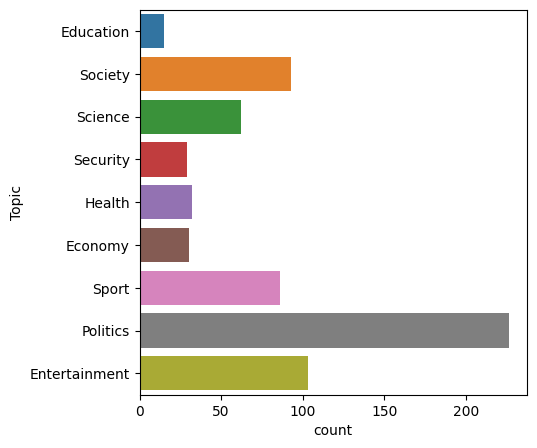

In [23]:
# plot the number of samples in 'subject'
plt.figure(figsize = (5, 5))
sns.countplot(y = "Topic", data = df)

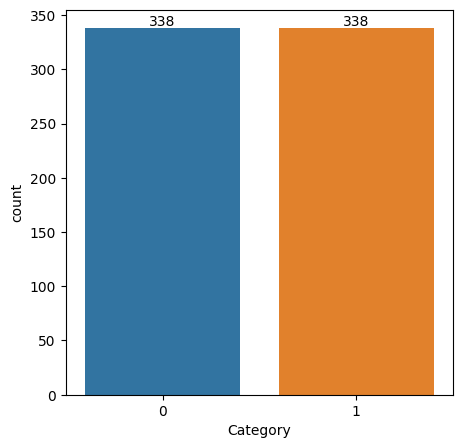

In [24]:
plt.figure(figsize = (5, 5))
counts = df['Category'].value_counts().rename_axis('Category').reset_index(name='count')
ax = sns.barplot(x='Category', y='count', data=counts)
ax.bar_label(ax.containers[0])
plt.show()

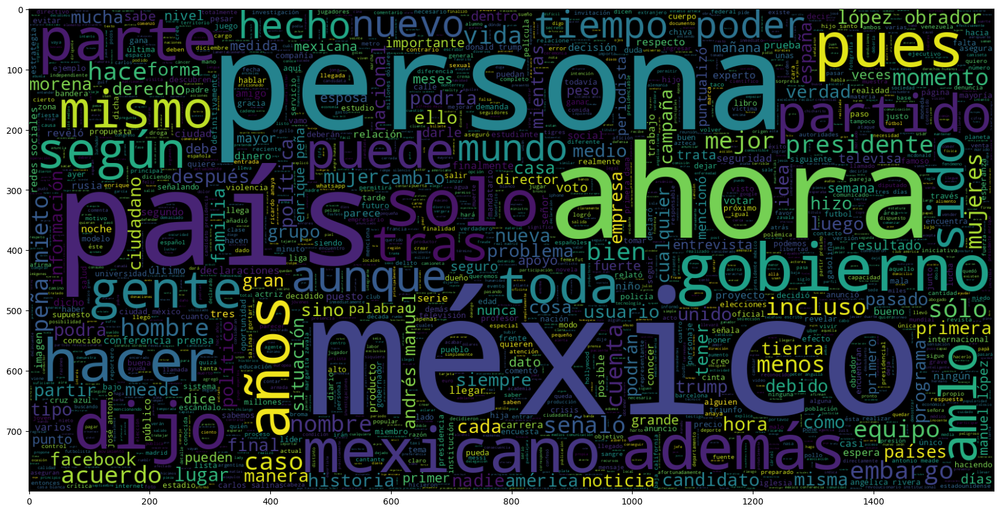

In [25]:
# plot the word cloud for text that is Real
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.Category == 1].clean_joined))
plt.imshow(wc, interpolation = 'bilinear')

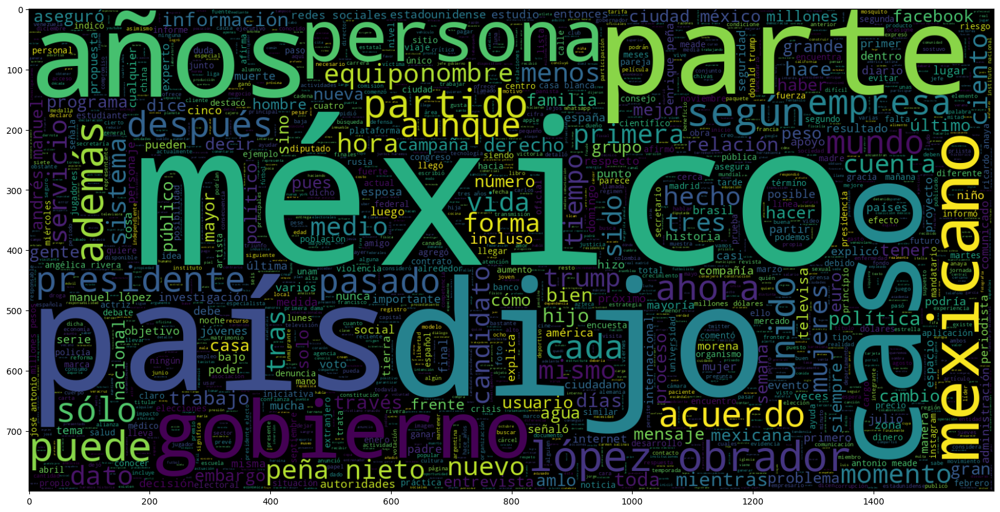

In [26]:
# plot the word cloud for text that is Fake
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.Category == 0].clean_joined))
plt.imshow(wc, interpolation = 'bilinear')

In [27]:
new_df = df.clean_joined.str.split(expand=True).stack().value_counts().reset_index()
new_df.columns = ['Word', 'Frequency'] 
new_df

,Word,Frequency
0,méxico,829
1,años,456
2,país,369
3,gobierno,344
4,presidente,340
...,...,...
23753,jaziel,1
23754,suheidi,1
23755,ixchel,1
23756,brianna,1


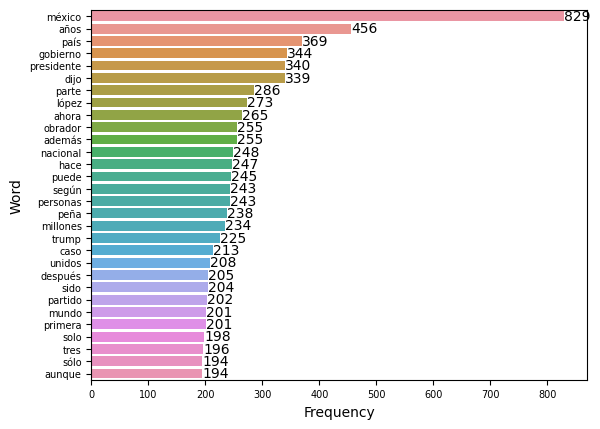

In [28]:
b = sns.barplot(x='Frequency',y='Word',data = new_df[:30])
b.tick_params(labelsize=7)
b.bar_label(b.containers[0])
plt.show()

In [29]:
from nltk import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/ale/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [30]:
# length of maximum document will be needed to create word embeddings 
maxlen = -1
for doc in df.clean_joined:
    tokens = nltk.word_tokenize(doc)
    if(maxlen<len(tokens)):
        maxlen = len(tokens)
print("The maximum number of words in any document is =", maxlen)

The maximum number of words in any document is = 1007


In [31]:
df.to_csv(r'/home/ale/Documents/data/Filter[FakeDeS2021]train.csv', index=False)

## Load and join data

In [32]:
# load the data
df = pd.read_csv("/home/ale/Documents/data/[FakeDeS2021]test.csv")
df.columns = ['Id','Category','Topic','Source','Headline','Text','Link']
line('dataset description')
df.info()
line('first lines')
df.head()

---   ---   ---   ---   ---   ---   [  dataset description  ]   ---   ---   ---   ---   ---   ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 572 entries, 0 to 571
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Id        572 non-null    int64 
 1   Category  572 non-null    bool  
 2   Topic     572 non-null    object
 3   Source    565 non-null    object
 4   Headline  500 non-null    object
 5   Text      572 non-null    object
 6   Link      569 non-null    object
dtypes: bool(1), int64(1), object(5)
memory usage: 27.5+ KB
---   ---   ---   ---   ---   ---   [  first lines  ]   ---   ---   ---   ---   ---   ---


,Id,Category,Topic,Source,Headline,Text,Link
0,1,True,Covid-19,El Economista,Covid-19: mentiras que matan,El control de la Covid-19 no es sólo un tema d...,https://www.eleconomista.com.mx/opinion/Covid-...
1,2,False,Política,El matinal,El Gobierno podrá acceder a las IPs de los móv...,El Gobierno de Pedro Sánchez y Pablo Iglesias ...,https://www.elmatinal.com/espana-ultima-hora/e...
2,3,True,Política,El País,La comunidad musulmana catalana denuncia a Vox...,Las tres federaciones que agrupan al 90% de la...,https://elpais.com/espana/elecciones-catalanas...
3,4,False,Política,AFPFactual,NaN,Se han dado a conocer los datos electorales pr...,https://perma.cc/GYE6-SPMB
4,5,True,Sociedad,La Republica,El censo poblacional 2018 tendrá un costo de $...,La primera fase del censo será virtual y solo ...,https://www.larepublica.co/economia/el-censo-p...


In [33]:
nan_in_df = df.isnull().sum()
nan_in_df

Id           0
Category     0
Topic        0
Source       7
Headline    72
Text         0
Link         3
dtype: int64

In [34]:
df.Headline = df.Headline.fillna('')

In [35]:
nan_in_df = df.isnull().sum()
nan_in_df

Id          0
Category    0
Topic       0
Source      7
Headline    0
Text        0
Link        3
dtype: int64

In [36]:
# Transform to vale
df.loc[df.Category == "Fake", "Category"] = 1
df.loc[df.Category == "True", "Category"] = 0

In [37]:
line('dataset transformed (Category)')
df.head()

---   ---   ---   ---   ---   ---   [  dataset transformed (Category)  ]   ---   ---   ---   ---   ---   ---


,Id,Category,Topic,Source,Headline,Text,Link
0,1,True,Covid-19,El Economista,Covid-19: mentiras que matan,El control de la Covid-19 no es sólo un tema d...,https://www.eleconomista.com.mx/opinion/Covid-...
1,2,False,Política,El matinal,El Gobierno podrá acceder a las IPs de los móv...,El Gobierno de Pedro Sánchez y Pablo Iglesias ...,https://www.elmatinal.com/espana-ultima-hora/e...
2,3,True,Política,El País,La comunidad musulmana catalana denuncia a Vox...,Las tres federaciones que agrupan al 90% de la...,https://elpais.com/espana/elecciones-catalanas...
3,4,False,Política,AFPFactual,,Se han dado a conocer los datos electorales pr...,https://perma.cc/GYE6-SPMB
4,5,True,Sociedad,La Republica,El censo poblacional 2018 tendrá un costo de $...,La primera fase del censo será virtual y solo ...,https://www.larepublica.co/economia/el-censo-p...


In [38]:
# combine title and text together
df['original'] = df['Headline'] + ' ' + df['Text']
line('dataset transformed (Headline + Text)')
df.head()

---   ---   ---   ---   ---   ---   [  dataset transformed (Headline + Text)  ]   ---   ---   ---   ---   ---   ---


,Id,Category,Topic,Source,Headline,Text,Link,original
0,1,True,Covid-19,El Economista,Covid-19: mentiras que matan,El control de la Covid-19 no es sólo un tema d...,https://www.eleconomista.com.mx/opinion/Covid-...,Covid-19: mentiras que matan El control de la ...
1,2,False,Política,El matinal,El Gobierno podrá acceder a las IPs de los móv...,El Gobierno de Pedro Sánchez y Pablo Iglesias ...,https://www.elmatinal.com/espana-ultima-hora/e...,El Gobierno podrá acceder a las IPs de los móv...
2,3,True,Política,El País,La comunidad musulmana catalana denuncia a Vox...,Las tres federaciones que agrupan al 90% de la...,https://elpais.com/espana/elecciones-catalanas...,La comunidad musulmana catalana denuncia a Vox...
3,4,False,Política,AFPFactual,,Se han dado a conocer los datos electorales pr...,https://perma.cc/GYE6-SPMB,Se han dado a conocer los datos electorales p...
4,5,True,Sociedad,La Republica,El censo poblacional 2018 tendrá un costo de $...,La primera fase del censo será virtual y solo ...,https://www.larepublica.co/economia/el-censo-p...,El censo poblacional 2018 tendrá un costo de $...


In [39]:
# df['original'][0]

## Data cleaning

In [40]:
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to /home/ale/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [41]:
import gensim
# Obtain additional stopwords from nltk
from nltk.corpus import stopwords
stop_words = stopwords.words('spanish')
# To add more stopwords
stop_words.extend(['number'])

In [42]:
line('print stop_words from spanish nltk')
print(stop_words)

---   ---   ---   ---   ---   ---   [  print stop_words from spanish nltk  ]   ---   ---   ---   ---   ---   ---
['de', 'la', 'que', 'el', 'en', 'y', 'a', 'los', 'del', 'se', 'las', 'por', 'un', 'para', 'con', 'no', 'una', 'su', 'al', 'lo', 'como', 'más', 'pero', 'sus', 'le', 'ya', 'o', 'este', 'sí', 'porque', 'esta', 'entre', 'cuando', 'muy', 'sin', 'sobre', 'también', 'me', 'hasta', 'hay', 'donde', 'quien', 'desde', 'todo', 'nos', 'durante', 'todos', 'uno', 'les', 'ni', 'contra', 'otros', 'ese', 'eso', 'ante', 'ellos', 'e', 'esto', 'mí', 'antes', 'algunos', 'qué', 'unos', 'yo', 'otro', 'otras', 'otra', 'él', 'tanto', 'esa', 'estos', 'mucho', 'quienes', 'nada', 'muchos', 'cual', 'poco', 'ella', 'estar', 'estas', 'algunas', 'algo', 'nosotros', 'mi', 'mis', 'tú', 'te', 'ti', 'tu', 'tus', 'ellas', 'nosotras', 'vosotros', 'vosotras', 'os', 'mío', 'mía', 'míos', 'mías', 'tuyo', 'tuya', 'tuyos', 'tuyas', 'suyo', 'suya', 'suyos', 'suyas', 'nuestro', 'nuestra', 'nuestros', 'nuestras', 'vuestr

In [43]:
# import required module (pip install Unidecode)
import unidecode

# Remove stopwords and remove words with 2 or less characters
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3 and token not in stop_words:
            # remove ascents
            # token = unidecode.unidecode(token)
            result.append(token)
            
    return result

In [44]:
# Apply preprocess function
df['clean'] = df['original'].apply(preprocess)

In [45]:
line('original data')
print(df['original'][0])
line('clean data')
print(df['clean'][0])

---   ---   ---   ---   ---   ---   [  original data  ]   ---   ---   ---   ---   ---   ---
Covid-19: mentiras que matan El control de la Covid-19 no es sólo un tema de médicos y el resto del personal sanitario y científico. Por desgracia o por fortuna, es un asunto esencialmente político que se decide por hombres y mujeres que se dedican a la política. De las creencias y opiniones de estos últimos, depende el éxito o el fracaso de las acciones que se implementen.

Los éxitos en la toma de decisiones salvan vidas y naciones; obviamente, los errores matan y más si están acompañados de mentiras y medias verdades. En este sentido, durante el pasado Pulso de la Salud (9 de febrero) el presidente López rompió un récord: en los primeros diez minutos había dicho tres mentiras graves o medias verdades, que también son mentiras. El problema con esto es que las mentiras matan.

En esa ocasión, López Obrador dijo que “afortunadamente” se estaban reduciendo los contagios en todo el país. Poco desp

In [46]:
line('actual dataframe')
df.head()

---   ---   ---   ---   ---   ---   [  actual dataframe  ]   ---   ---   ---   ---   ---   ---


,Id,Category,Topic,Source,Headline,Text,Link,original,clean
0,1,True,Covid-19,El Economista,Covid-19: mentiras que matan,El control de la Covid-19 no es sólo un tema d...,https://www.eleconomista.com.mx/opinion/Covid-...,Covid-19: mentiras que matan El control de la ...,"[covid, mentiras, matan, control, covid, sólo,..."
1,2,False,Política,El matinal,El Gobierno podrá acceder a las IPs de los móv...,El Gobierno de Pedro Sánchez y Pablo Iglesias ...,https://www.elmatinal.com/espana-ultima-hora/e...,El Gobierno podrá acceder a las IPs de los móv...,"[gobierno, podrá, acceder, móviles, sabrá, nom..."
2,3,True,Política,El País,La comunidad musulmana catalana denuncia a Vox...,Las tres federaciones que agrupan al 90% de la...,https://elpais.com/espana/elecciones-catalanas...,La comunidad musulmana catalana denuncia a Vox...,"[comunidad, musulmana, catalana, denuncia, inc..."
3,4,False,Política,AFPFactual,,Se han dado a conocer los datos electorales pr...,https://perma.cc/GYE6-SPMB,Se han dado a conocer los datos electorales p...,"[dado, conocer, datos, electorales, preliminar..."
4,5,True,Sociedad,La Republica,El censo poblacional 2018 tendrá un costo de $...,La primera fase del censo será virtual y solo ...,https://www.larepublica.co/economia/el-censo-p...,El censo poblacional 2018 tendrá un costo de $...,"[censo, poblacional, costo, millones, primera,..."


In [47]:
# Total words present in the dataset
list_of_words = []
for i in df.clean:
    for j in i:
        list_of_words.append(j)

In [48]:
line('list of total words')
print(list_of_words)

---   ---   ---   ---   ---   ---   [  list of total words  ]   ---   ---   ---   ---   ---   ---
['covid', 'mentiras', 'matan', 'control', 'covid', 'sólo', 'tema', 'médicos', 'resto', 'personal', 'sanitario', 'científico', 'desgracia', 'fortuna', 'asunto', 'esencialmente', 'político', 'decide', 'hombres', 'mujeres', 'dedican', 'política', 'creencias', 'opiniones', 'últimos', 'depende', 'éxito', 'fracaso', 'acciones', 'implementen', 'éxitos', 'toma', 'decisiones', 'salvan', 'vidas', 'naciones', 'obviamente', 'errores', 'matan', 'acompañados', 'mentiras', 'medias', 'verdades', 'pasado', 'pulso', 'salud', 'febrero', 'presidente', 'lópez', 'rompió', 'récord', 'primeros', 'diez', 'minutos', 'dicho', 'tres', 'mentiras', 'graves', 'medias', 'verdades', 'mentiras', 'problema', 'mentiras', 'matan', 'ocasión', 'lópez', 'obrador', 'dijo', 'afortunadamente', 'reduciendo', 'contagios', 'país', 'después', 'subsecretario', 'lópez', 'gatell', 'camino', 'complementó', 'tesis', 'últimas', 'semanas', 't

In [49]:
line('len - list of total words')
print(len(list_of_words))

---   ---   ---   ---   ---   ---   [  len - list of total words  ]   ---   ---   ---   ---   ---   ---
145859


In [50]:
line('unique words - list of total words')
total_words = len(list(set(list_of_words)))
print(total_words)

---   ---   ---   ---   ---   ---   [  unique words - list of total words  ]   ---   ---   ---   ---   ---   ---
25101


In [51]:
# join the words into a string
df['clean_joined'] = df['clean'].apply(lambda x: " ".join(x))

In [52]:
line('actual dataframe')
df.head()

---   ---   ---   ---   ---   ---   [  actual dataframe  ]   ---   ---   ---   ---   ---   ---


,Id,Category,Topic,Source,Headline,Text,Link,original,clean,clean_joined
0,1,True,Covid-19,El Economista,Covid-19: mentiras que matan,El control de la Covid-19 no es sólo un tema d...,https://www.eleconomista.com.mx/opinion/Covid-...,Covid-19: mentiras que matan El control de la ...,"[covid, mentiras, matan, control, covid, sólo,...",covid mentiras matan control covid sólo tema m...
1,2,False,Política,El matinal,El Gobierno podrá acceder a las IPs de los móv...,El Gobierno de Pedro Sánchez y Pablo Iglesias ...,https://www.elmatinal.com/espana-ultima-hora/e...,El Gobierno podrá acceder a las IPs de los móv...,"[gobierno, podrá, acceder, móviles, sabrá, nom...",gobierno podrá acceder móviles sabrá nombre ma...
2,3,True,Política,El País,La comunidad musulmana catalana denuncia a Vox...,Las tres federaciones que agrupan al 90% de la...,https://elpais.com/espana/elecciones-catalanas...,La comunidad musulmana catalana denuncia a Vox...,"[comunidad, musulmana, catalana, denuncia, inc...",comunidad musulmana catalana denuncia incitar ...
3,4,False,Política,AFPFactual,,Se han dado a conocer los datos electorales pr...,https://perma.cc/GYE6-SPMB,Se han dado a conocer los datos electorales p...,"[dado, conocer, datos, electorales, preliminar...",dado conocer datos electorales preliminares pe...
4,5,True,Sociedad,La Republica,El censo poblacional 2018 tendrá un costo de $...,La primera fase del censo será virtual y solo ...,https://www.larepublica.co/economia/el-censo-p...,El censo poblacional 2018 tendrá un costo de $...,"[censo, poblacional, costo, millones, primera,...",censo poblacional costo millones primera fase ...


In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

<AxesSubplot: xlabel='count', ylabel='Topic'>

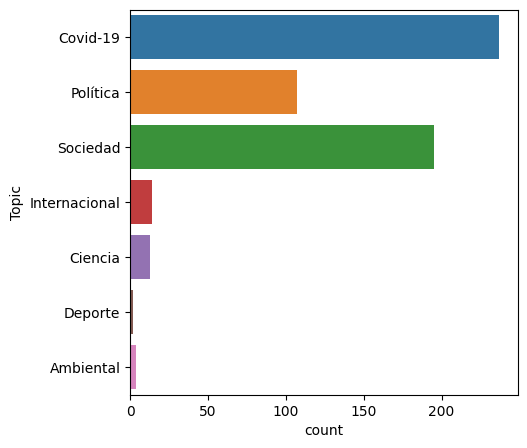

In [54]:
# plot the number of samples in 'subject'
plt.figure(figsize = (5, 5))
sns.countplot(y = "Topic", data = df)

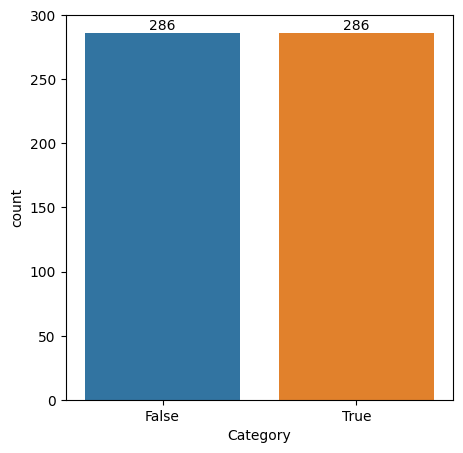

In [55]:
plt.figure(figsize = (5, 5))
counts = df['Category'].value_counts().rename_axis('Category').reset_index(name='count')
ax = sns.barplot(x='Category', y='count', data=counts)
ax.bar_label(ax.containers[0])
plt.show()

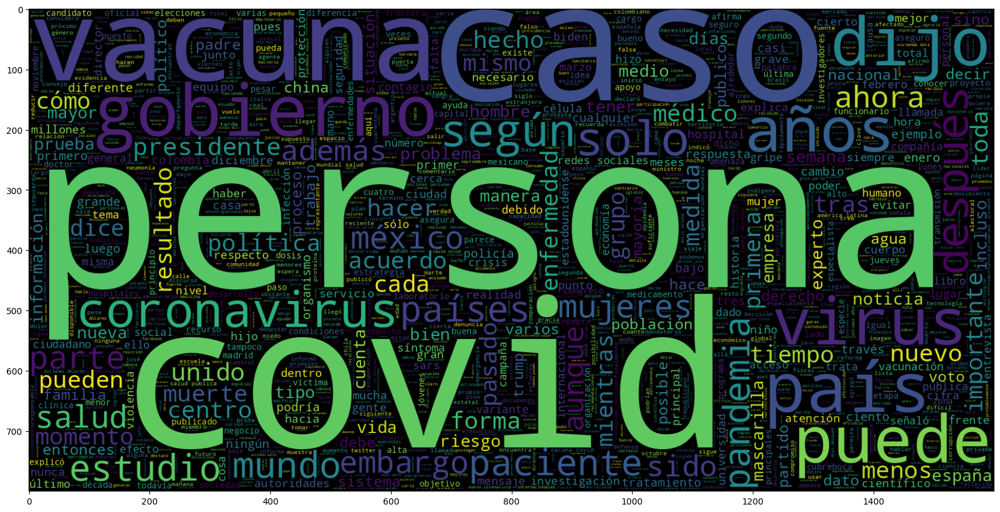

In [56]:
# plot the word cloud for text that is Real
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.Category == 1].clean_joined))
plt.imshow(wc, interpolation = 'bilinear')

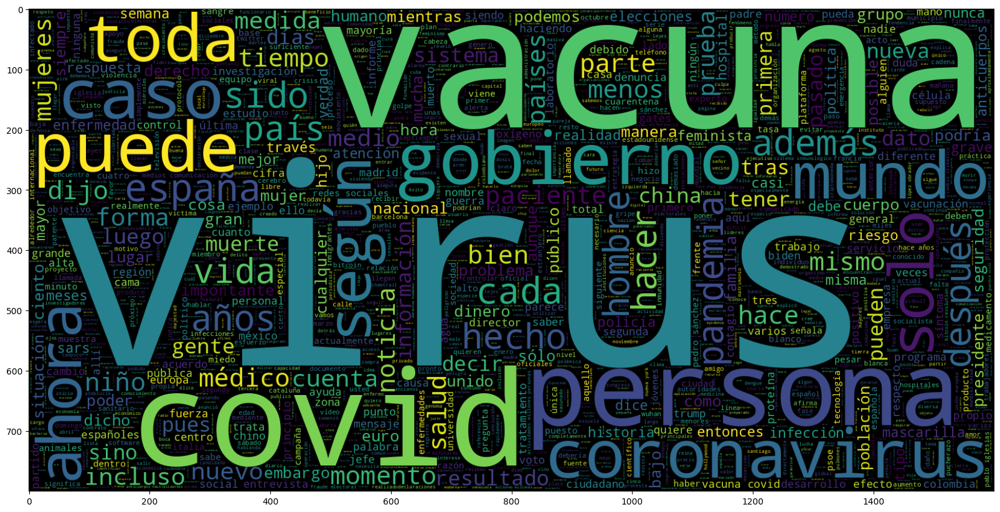

In [57]:
# plot the word cloud for text that is Fake
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.Category == 0].clean_joined))
plt.imshow(wc, interpolation = 'bilinear')

In [58]:
new_df = df.clean_joined.str.split(expand=True).stack().value_counts().reset_index()
new_df.columns = ['Word', 'Frequency'] 
new_df

,Word,Frequency
0,covid,763
1,personas,608
2,virus,534
3,años,465
4,coronavirus,456
...,...,...
25096,encadenada,1
25097,zumo,1
25098,distribuirlo,1
25099,predicted,1


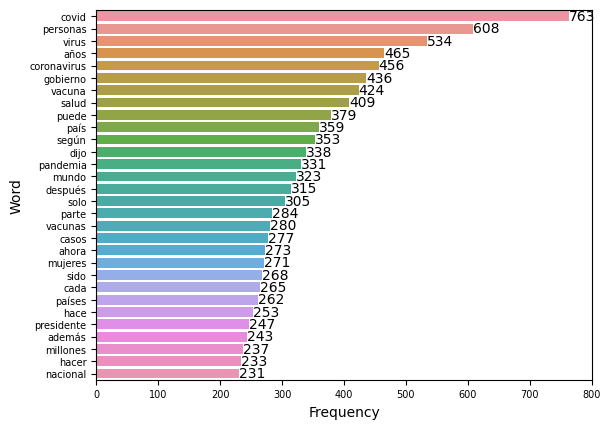

In [59]:
b = sns.barplot(x='Frequency',y='Word',data = new_df[:30])
b.tick_params(labelsize=7)
b.bar_label(b.containers[0])
plt.show()

In [60]:
from nltk import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/ale/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [61]:
# length of maximum document will be needed to create word embeddings 
maxlen = -1
for doc in df.clean_joined:
    tokens = nltk.word_tokenize(doc)
    if(maxlen<len(tokens)):
        maxlen = len(tokens)
print("The maximum number of words in any document is =", maxlen)

The maximum number of words in any document is = 1983


In [62]:
df.to_csv(r'/home/ale/Documents/data/Filter[FakeDeS2021]test.csv', index=False)